# Geopandas

# One Hashtag

## Two Hashtags

### Three Hashtags

#### Four Hashtags

No Hashtags

Import the necessary libraries.  
Note that Line2D is something that is needed as a workaround for an issue that will be described later.

In [4]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [7]:
%cd /content/drive/MyDrive/

/content/drive/MyDrive


In [8]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
import geopandas as gpd

In [9]:
usa_gdf = gpd.read_file('s_18mr25.shp')

In [10]:
print(usa_gdf.head(70))

   STATE                      NAME FIPS         LON        LAT  \
0     AL                   Alabama   01  -86.826760  32.793540   
1     AR                  Arkansas   05  -92.439200  34.899770   
2     AS            American Samoa   60 -170.372150 -14.264860   
3     AZ                   Arizona   04 -111.664570  34.293230   
4     CA                California   06 -119.608180  37.245370   
5     CO                  Colorado   08 -105.547830  38.998550   
6     CT               Connecticut   09  -72.726230  41.621960   
7     DC      District of Columbia   11  -77.014640  38.909320   
8     DE                  Delaware   10  -75.505920  38.995590   
9     GA                   Georgia   13  -83.448480  32.651550   
10    HI                    Hawaii   15 -156.347430  20.249230   
11    IA                      Iowa   19  -93.500030  42.074630   
12    ID                     Idaho   16 -114.659330  44.389070   
13    IL                  Illinois   17  -89.198380  40.065010   
14    IN  

<Axes: >

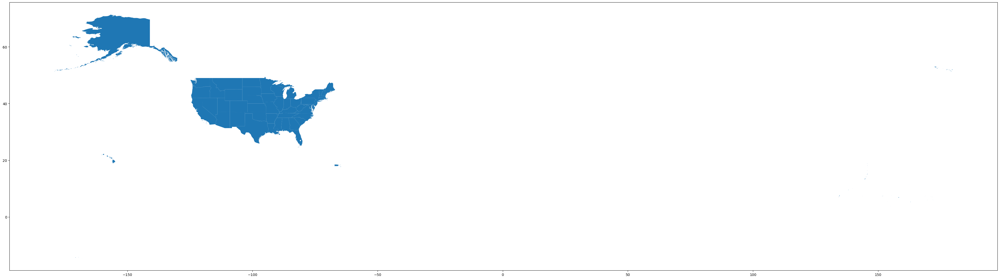

In [11]:
usa_gdf.plot(figsize=(50,50))

<Axes: >

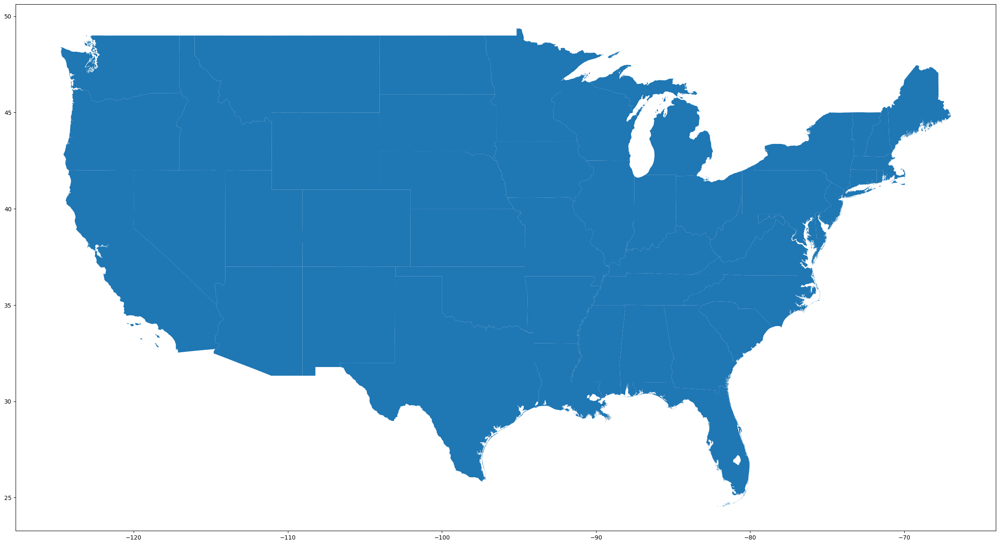

In [12]:
usa_gdf = usa_gdf.drop([2, 10, 36, 43, 51, 53, 54, 55, 56, 58])
usa_gdf.plot(figsize=(30,30))

<Axes: >

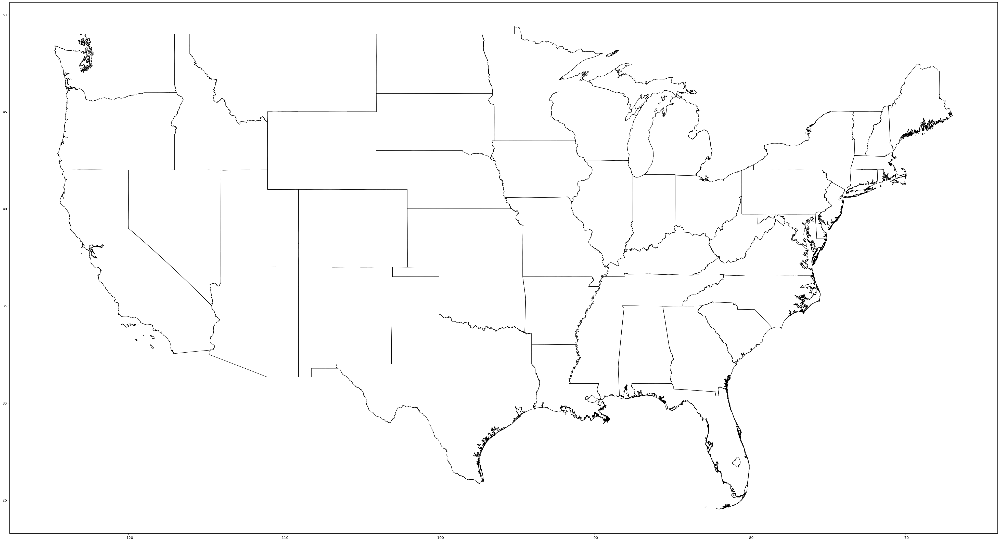

In [13]:
usa_gdf.plot(color='None', edgecolor='black', figsize=(50,50))

In [17]:
snowfall_df = pd.read_csv('snowfall_521.csv')

In [18]:
snowfall_gdf = gpd.GeoDataFrame(snowfall_df, geometry=gpd.points_from_xy(snowfall_df.Longitude, snowfall_df.Latitude))

<Axes: title={'center': 'Weather Station Locations'}>

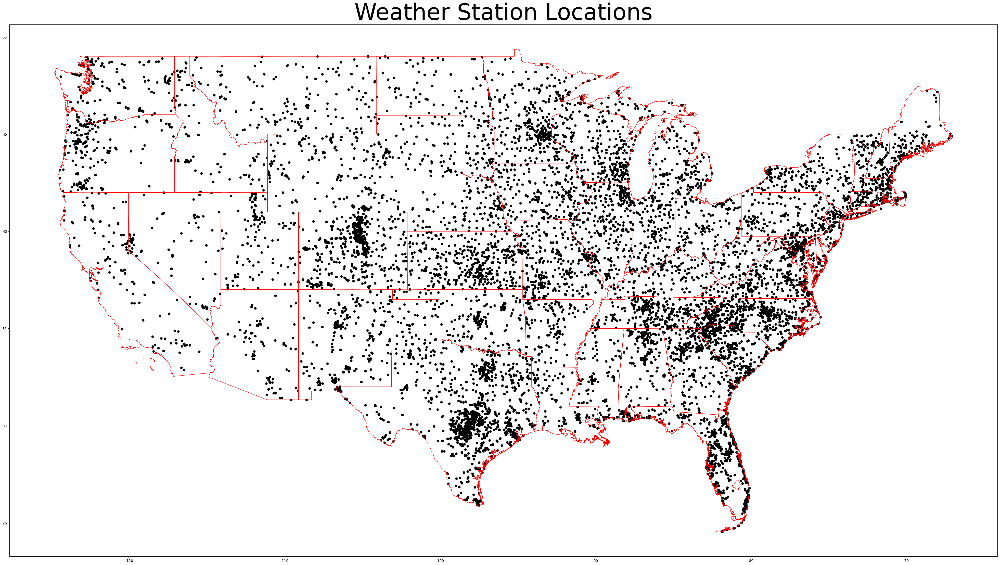

In [19]:
my_fig, my_ax = plt.subplots(figsize=(50,50))
my_ax.set_title('Weather Station Locations', fontdict={'fontsize': '64'})
snowfall_gdf.plot(ax=my_ax, color='black', marker='o')
usa_gdf.plot(ax=my_ax, color='None', edgecolor='red')

<Axes: title={'center': 'Weather Station Locations'}>

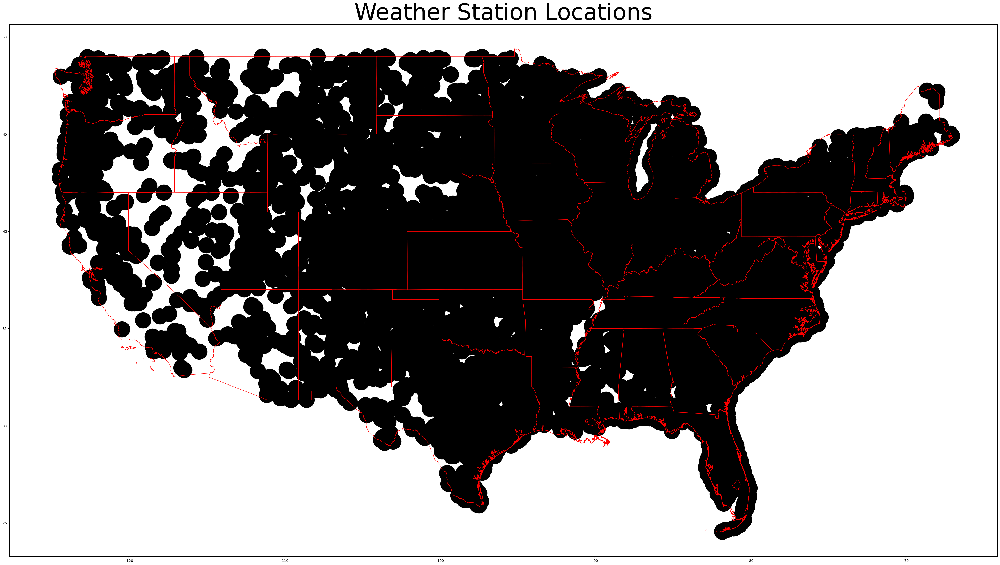

In [20]:
my_fig, my_ax = plt.subplots(figsize=(50,50))
my_ax.set_title('Weather Station Locations', fontdict={'fontsize': '64'})
snowfall_gdf.plot(ax=my_ax, color='black', marker='o', markersize=2000)
usa_gdf.plot(ax=my_ax, color='None', edgecolor='red')

In [21]:
snowfall_gdf = snowfall_gdf.astype({'Dec 25': 'float'})

In [22]:
snowfall_yes_gdf = snowfall_gdf.loc[snowfall_gdf['Dec 25'] > 0]

[None]

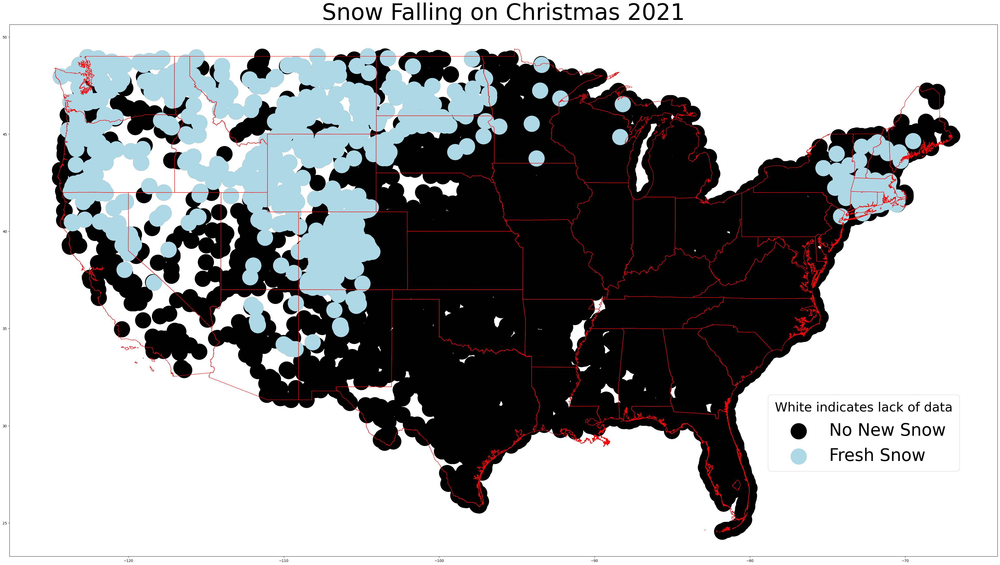

In [23]:
fig, my_ax = plt.subplots(figsize=(50,50))
my_ax.set_title('Snow Falling on Christmas 2021', fontdict={'fontsize': '64'})
snowfall_gdf.plot(ax=my_ax, markersize=2000, color='black', marker='o')
snowfall_yes_gdf.plot(ax=my_ax, markersize=2000, color='lightblue', marker='o')
usa_gdf.plot(ax=my_ax, color='None', edgecolor='red')
legend = my_ax.legend(['No New Snow', 'Fresh Snow'], title='White indicates lack of data', fontsize=48, bbox_to_anchor=(0.97, 0.32))
plt.setp(legend.get_title(), fontsize=36)

In [24]:
snowdepth_df = pd.read_csv('snowdepth_521.csv')
snowdepth_gdf = gpd.GeoDataFrame(snowdepth_df, geometry=gpd.points_from_xy(snowdepth_df.Longitude, snowdepth_df.Latitude))
snowdepth_yes_gdf = snowdepth_gdf.loc[snowdepth_gdf['Dec 25'] > 0]
snowdepth_4_gdf = snowdepth_gdf.loc[snowdepth_gdf['Dec 25'] > 4]

[None]

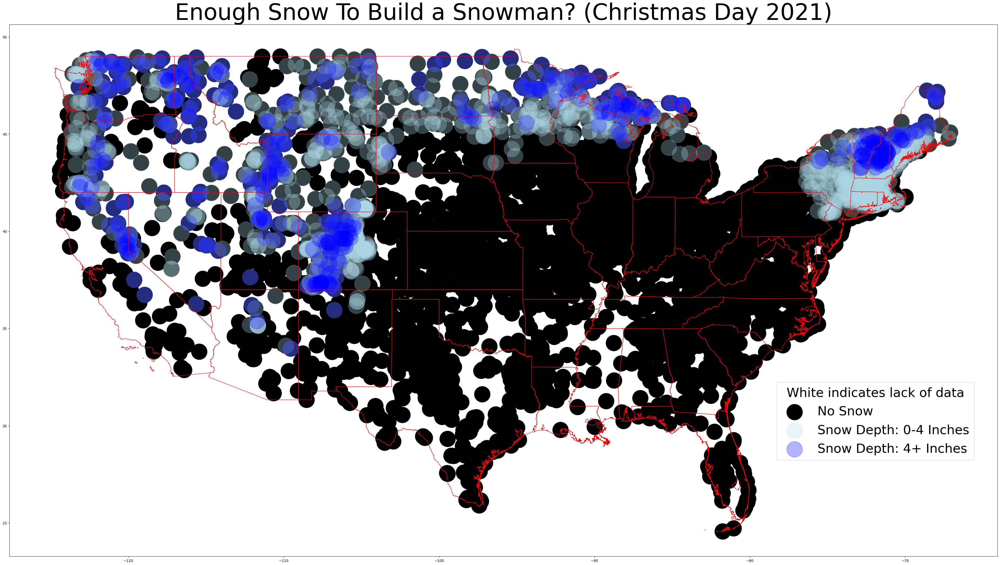

In [25]:
fig, my_ax = plt.subplots(figsize=(50,50))
my_ax.set_title('Enough Snow To Build a Snowman? (Christmas Day 2021)', fontdict={'fontsize': '64'})
snowdepth_gdf.plot(ax=my_ax, markersize=2000, color='black', marker='o')
snowdepth_yes_gdf.plot(ax=my_ax, markersize=2000, color='lightblue', marker='o', alpha=0.3)
snowdepth_4_gdf.plot(ax=my_ax, markersize=2000, color='blue', marker='o', alpha=0.3)
usa_gdf.plot(ax=my_ax, color='None', edgecolor='red')
legend = my_ax.legend(['No Snow', 'Snow Depth: 0-4 Inches', 'Snow Depth: 4+ Inches', 'Favorable Temp'],
                      title='White indicates lack of data', fontsize=36, bbox_to_anchor=(0.77, 0.34))
plt.setp(legend.get_title(), fontsize=36)

In [26]:
temp_df = pd.read_csv('temps_and_coords_521.csv')
temp_gdf = gpd.GeoDataFrame(temp_df, geometry=gpd.points_from_xy(temp_df.LONGITUDE, temp_df.LATITUDE))
temp_good_gdf = temp_gdf.loc[(temp_gdf['MAXTEMP'] >= 30) & (temp_gdf['MAXTEMP'] <= 40)]

[None]

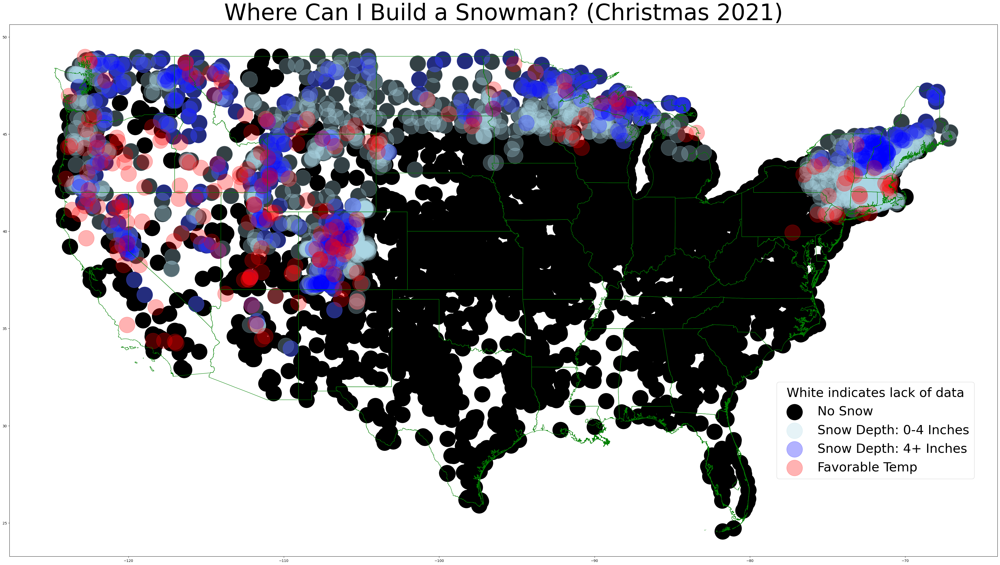

In [27]:
fig, ax = plt.subplots(figsize=(50,50))
ax.set_title('Where Can I Build a Snowman? (Christmas 2021)', fontdict={'fontsize': '64'})
snowdepth_gdf.plot(ax=ax, markersize=2000, color='black', marker='o')
snowdepth_yes_gdf.plot(ax=ax, markersize=2000, color='lightblue', marker='o', alpha=0.3)
snowdepth_4_gdf.plot(ax=ax, markersize=2000, color='blue', marker='o', alpha=0.3)
temp_good_gdf.plot(ax=ax, markersize=2000, color='red', marker='o', alpha=0.3)
usa_gdf.plot(ax=ax, color='None', edgecolor='green')
legend = ax.legend(['No Snow', 'Snow Depth: 0-4 Inches', 'Snow Depth: 4+ Inches', 'Favorable Temp'],
                   title='White indicates lack of data', fontsize=36, bbox_to_anchor=(0.77, 0.34))
plt.setp(legend.get_title(), fontsize=36)

In [28]:
snowdepth_gdf = gpd.GeoDataFrame(snowdepth_df, geometry=gpd.points_from_xy(snowdepth_df.Longitude, snowdepth_df.Latitude), crs='epsg:4326')
snowdepth_gdf = snowdepth_gdf.astype({'Dec 25': 'float'})
snowdepth_yes_gdf = snowdepth_gdf.loc[snowdepth_gdf['Dec 25'] > 0]
snowdepth_4_gdf = snowdepth_gdf.loc[snowdepth_gdf['Dec 25'] > 4]
temp_gdf = gpd.GeoDataFrame(temp_df, geometry=gpd.points_from_xy(temp_df.LONGITUDE, temp_df.LATITUDE), crs='epsg:4326')
temp_good_gdf = temp_gdf.loc[(temp_gdf['MAXTEMP'] >= 30) & (temp_gdf['MAXTEMP'] <= 40)]

In [29]:
usa_gdf = usa_gdf.to_crs('epsg:3395')
snowdepth_gdf = snowdepth_gdf.to_crs('epsg:3395')
snowdepth_yes_gdf = snowdepth_yes_gdf.to_crs('epsg:3395')
snowdepth_4_gdf = snowdepth_4_gdf.to_crs('epsg:3395')
temp_good_gdf = temp_good_gdf.to_crs('epsg:3395')

In [30]:
snowdepth_gdf['geometry'] = snowdepth_gdf.buffer(50000)
snowdepth_yes_gdf['geometry'] = snowdepth_yes_gdf.buffer(50000)
snowdepth_4_gdf['geometry'] = snowdepth_4_gdf.buffer(50000)
temp_good_gdf['geometry'] = temp_good_gdf.buffer(50000)

[None]

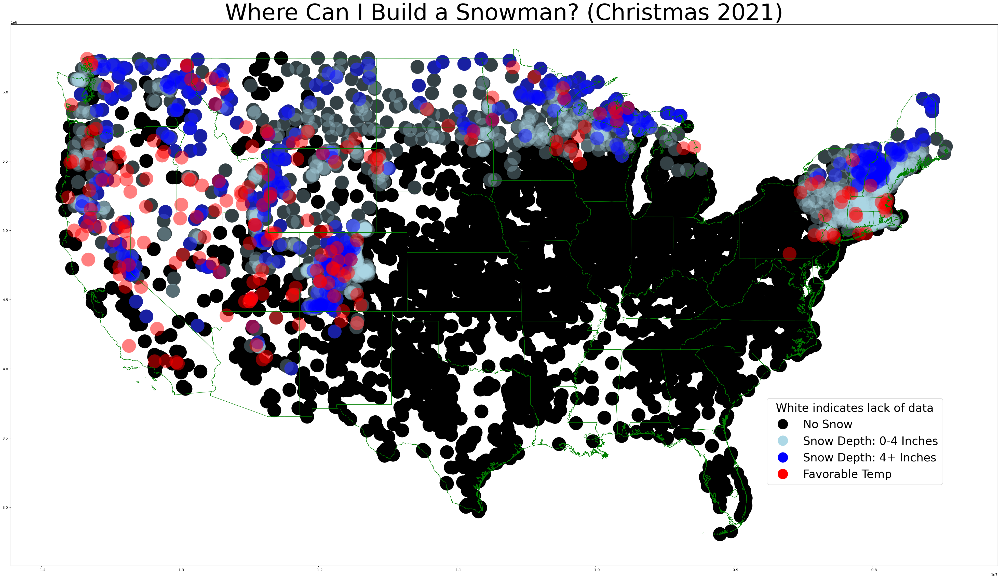

In [31]:
fig, ax = plt.subplots(figsize=(50,50))
ax.set_title('Where Can I Build a Snowman? (Christmas 2021)', fontdict={'fontsize': '64'})
snowdepth_gdf.plot(ax=ax, color='black')
snowdepth_yes_gdf.plot(ax=ax, color='lightblue', alpha=0.3)
snowdepth_4_gdf.plot(ax=ax, color='blue', alpha=0.5)
temp_good_gdf.plot(ax=ax, color='red', alpha=0.5)
usa_gdf.plot(ax=ax, color='None', edgecolor='green')

legend_elements = [Line2D([0], [0], marker='o', markersize=30, color='white', markerfacecolor='black', label='No Snow'),
                   Line2D([0], [0], marker='o', markersize=30, color='white', markerfacecolor='lightblue', label='Snow Depth: 0-4 Inches'),
                   Line2D([0], [0], marker='o', markersize=30, color='white', markerfacecolor='blue', label='Snow Depth: 4+ Inches'),
                   Line2D([0], [0], marker='o', markersize=30, color='white', markerfacecolor='red', label='Favorable Temp')]
legend = ax.legend(handles=legend_elements, title='White indicates lack of data', fontsize=32, bbox_to_anchor=(0.95, 0.32))
plt.setp(legend.get_title(), fontsize=32)

In [32]:
snowman_gdf = snowdepth_4_gdf.overlay(temp_good_gdf, how='intersection')

<Axes: title={'center': 'Where Can I Build a Snowman? (Christmas 2021)'}>

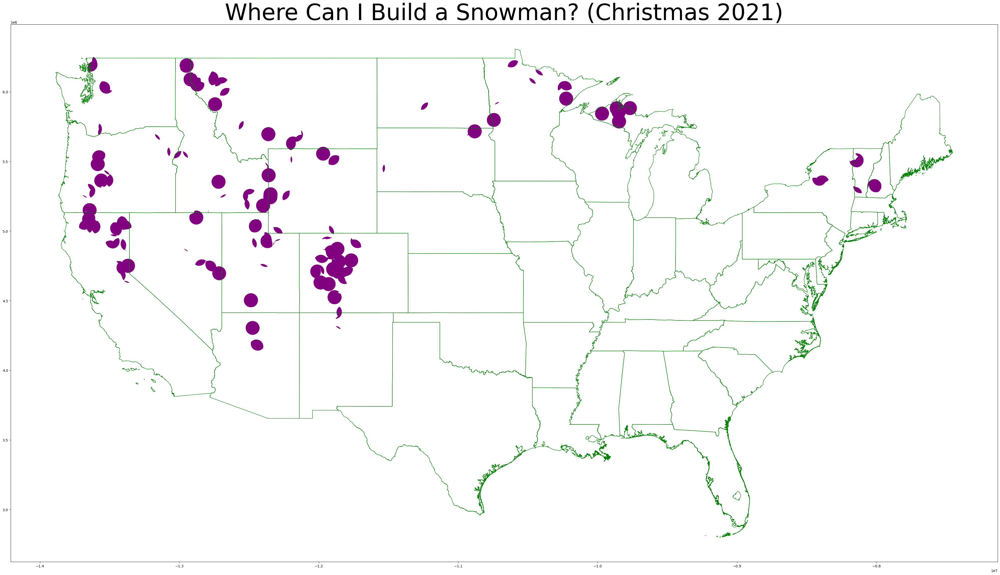

In [33]:
fig, ax = plt.subplots(figsize=(50,50))
ax.set_title('Where Can I Build a Snowman? (Christmas 2021)', fontdict={'fontsize': '64'})
snowman_gdf.plot(ax=ax, color='purple')
usa_gdf.plot(ax=ax, color='None', edgecolor='green')

[None]

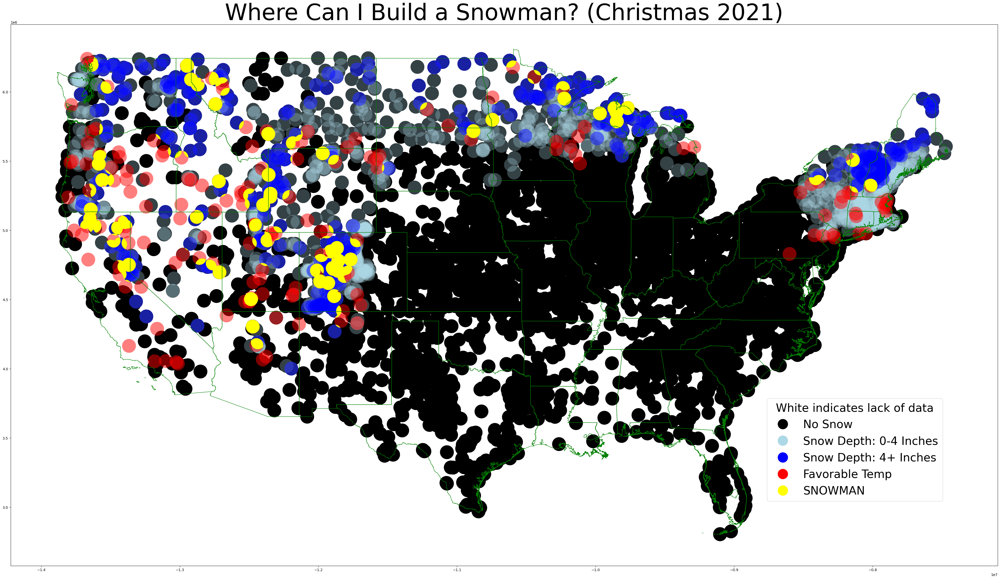

In [34]:
fig, ax = plt.subplots(figsize=(50,50))
ax.set_title('Where Can I Build a Snowman? (Christmas 2021)', fontdict={'fontsize': '64'})
snowdepth_gdf.plot(ax=ax, color='black')
snowdepth_yes_gdf.plot(ax=ax, color='lightblue', alpha=0.3)
snowdepth_4_gdf.plot(ax=ax, color='blue', alpha=0.5)
temp_good_gdf.plot(ax=ax, color='red', alpha=0.5)
snowman_gdf.plot(ax=ax, color='yellow')
usa_gdf.plot(ax=ax, color='None', edgecolor='green')

legend_elements = [Line2D([0], [0], marker='o', markersize=30, color='white', markerfacecolor='black', label='No Snow'),
                   Line2D([0], [0], marker='o', markersize=30, color='white', markerfacecolor='lightblue', label='Snow Depth: 0-4 Inches'),
                   Line2D([0], [0], marker='o', markersize=30, color='white', markerfacecolor='blue', label='Snow Depth: 4+ Inches'),
                   Line2D([0], [0], marker='o', markersize=30, color='white', markerfacecolor='red', label='Favorable Temp'),
                   Line2D([0], [0], marker='o', markersize=30, color='white', markerfacecolor='yellow', label='SNOWMAN')]
legend = ax.legend(handles=legend_elements, title='White indicates lack of data', fontsize=32, bbox_to_anchor=(0.95, 0.32))
plt.setp(legend.get_title(), fontsize=32)